<h1 align=center><font size = 5>Crimes in Chicago - One year prior to Present (Sept. 17th 2021)</font></h1>

## Introduction
In this notebook, I am going to explore incidents of crime (with the exception of murders where data exists for each victim) that have occurred in the City of Chicago over the past year, minus the most recent seven days of data. Data is extracted from the Chicago Police Department's CLEAR (Citizen Law Enforcement Analysis and Reporting) system and was available for public use on data.gov where you can find further information about it on [This link](https://catalog.data.gov/dataset/crimes-one-year-prior-to-present)
`which is updated on a daily-basis such that it is important to notice that the following analysis is performed on Sept. 18th 2021!`
* Below is a table describing all terms included in the dataset, so that it would be more readible for you.


|Item# | Column Name | Description |
|:---: | :----------:  | :----------  |
|1 | CASE#  | The Chicago Police Department RD Number (Records Division Number), which is unique to the incident  |
|2 | DATE OF OCCURRENCE  | Date when the incident occurred. This is sometimes a best estimate  |
|3 | BLOCK  | 	The partially redacted address where the incident occurred, placing it on the same block as the actual address  |
|4 | IUCR  | 	The Illinois Uniform Crime Reporting Code. This is directly linked to the Primary Type and Description |
|5 | PRIMARY DESCRIPTION  | 	The primary description of the IUCR code  |
|6 | SECONDARY DESCRIPTION  | The secondary description of the IUCR code, a subcategory of the primary description  |
|7 | LOCATION DESCRIPTION  | 	Description of the location where the incident occurred  |
|8 | ARREST  | Indicates whether an arrest was made  |
|9 | DOMESTIC  | Indicates whether the incident was domestic-related as defined by the Illinois Domestic Violence Act  |
|10 | BEAT  | 	Indicates the beat where the incident occurred. A beat is the smallest police geographic area - each beat has a dedicated police beat car. Three to five beats make up a police sector, and three sectors make up a police district  |
|11 | WARD  | The ward (City Council district) where the incident occurred  |
|12 | FBI CD  | Indicates the crime classification as outlined in the FBI's National Incident-Based Reporting System (NIBRS)   |
|13 | X COORDINATE  | The x coordinate of the location where the incident occurred in State Plane Illinois East NAD 1983 projection  |
|14 | Y COORDINATE  | The y coordinate of the location where the incident occurred in State Plane Illinois East NAD 1983 projection  |
|15 | LATITUDE  | The latitude of the location where the incident occurred  |
|16 | LONGITUDE  | The longitude of the location where the incident occurred  |
|17 | LOCATION  | 	The location where the incident occurred in a format that allows for creation of maps and other geographic operations on this data portal  |

`NOTE:`  All locations are shifted from the actual location for partial redaction but fall on the same block.

## Table of Contents

<div class="alert alert-block alert-info" style="margin-top: 20px">

<font size = 3>

1.  <a href="#item1">Download and Explore Dataset</a>
    

2.  <a href="#item2">Data visualization</a>
    
    
2.  <a href="#item2">Statistical Analysis</a>
     
    </font>
    </div>


Before we start exploring the dataset, let's first load all libraries and depnedencies that we would use later.

In [1]:
import numpy as np # library to handle data in a vectorized manner
import pandas as pd # library to handle data into tables for further analysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import matplotlib.pyplot as plt # Library for visualization
%matplotlib inline
import seaborn as sns # Advanced library for visualization

#!conda install -c conda-forge folium=0.5.0 --yes
import folium # map rendering library
#!conda install -c conda-forge geopy --yes 
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import itertools
import scipy.stats as ss # scipy statistics
from scipy.stats import chi2_contingency
from scipy.stats import norm
from scipy.stats import chi2

import warnings # Ignore warnings and filtering them
warnings.filterwarnings("ignore")

## 1. Download and Explore Dataset

First, we use wget `with -O flag` to load the dataset directly from a hyperlink as it is stored on data.gov and we name it to chicago_crime_one_year_to_present.csv file since it is already in csv format, so we can deal with it easily in further analysis

In [2]:
!wget -O 'chicago_crime_one_year_to_present.csv' https://data.cityofchicago.org/api/views/x2n5-8w5q/rows.csv

--2021-09-19 13:56:44--  https://data.cityofchicago.org/api/views/x2n5-8w5q/rows.csv
Resolving data.cityofchicago.org (data.cityofchicago.org)... 52.206.140.199, 52.206.68.26, 52.206.140.205
Connecting to data.cityofchicago.org (data.cityofchicago.org)|52.206.140.199|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/csv]
Saving to: ‘chicago_crime_one_year_to_present.csv’

chicago_crime_one_y     [              <=>   ]  36.21M  3.56MB/s    in 10s     

2021-09-19 13:56:55 (3.57 MB/s) - ‘chicago_crime_one_year_to_present.csv’ saved [37964098]



Next, we use `pandas.read_csv` metohd to load the data into a dataframe called df, and use `pandas.head` method to represent the first five rows of the dataframe!

In [3]:
df = pd.read_csv('chicago_crime_one_year_to_present.csv') # loading the dataset
df.head() # showing the first five rows of the dataframe created

,CASE#,DATE OF OCCURRENCE,BLOCK,IUCR,PRIMARY DESCRIPTION,SECONDARY DESCRIPTION,LOCATION DESCRIPTION,ARREST,DOMESTIC,BEAT,WARD,FBI CD,X COORDINATE,Y COORDINATE,LATITUDE,LONGITUDE,LOCATION
0,JE163990,11/23/2020 03:05:00 PM,073XX S SOUTH SHORE DR,0820,THEFT,$500 AND UNDER,APARTMENT,N,N,334,7.0,06,NaN,NaN,NaN,NaN,NaN
1,JE266628,06/15/2021 09:30:00 AM,080XX S DREXEL AVE,0820,THEFT,$500 AND UNDER,STREET,N,N,631,8.0,06,1183633.0,1851786.0,41.748486,-87.602675,"(41.748486365, -87.602675062)"
2,JE266536,06/15/2021 07:50:00 AM,042XX W MADISON ST,0560,ASSAULT,SIMPLE,SIDEWALK,N,N,1115,28.0,08A,1148227.0,1899678.0,41.880661,-87.731186,"(41.880660786, -87.731186405)"
3,JE266663,06/15/2021 08:40:00 AM,044XX N ARTESIAN AVE,1153,DECEPTIVE PRACTICE,FINANCIAL IDENTITY THEFT OVER $ 300,NaN,N,N,1911,47.0,11,NaN,NaN,NaN,NaN,NaN
4,JE267466,06/15/2021 09:01:00 PM,007XX S KEDZIE AVE,051B,ASSAULT,AGGRAVATED - OTHER FIREARM,SIDEWALK,Y,N,1134,24.0,04A,1155154.0,1896404.0,41.871540,-87.705839,"(41.87154041, -87.705838807)"


Then, we do some cleaning for the dataframe columns such as lowering all the charachetrs of headers, stripping any unnecessary spaces and replacing neecessary spaces with udnerscore, so that we can call the columns easier later.

In [4]:
df.rename(columns = lambda x: x.lower().strip().replace('  ', '_').replace(' ', '_'), inplace = True) # Cleaning headers names

Now, let's investigate some basic characteristics of the dataset by exploring the size of the data we have and the total number / proportion of missing data that we will handle later! Then, we investigate the type of data in each column using `df.info()` method.

In [5]:
print('There are %d features and %d observations in the dataset of which %d cells have missing values where the maximum proportion of missing\
 data in a column does not exceed %.2f %% of the total observations!'
      %(df.shape[1], df.shape[0], df.isnull().sum().sum(), df.isnull().sum().max() / df.shape[0] *100)) # Printing some properties of the dataset

There are 17 features and 201236 observations in the dataset of which 12305 cells have missing values where the maximum proportion of missing data in a column does not exceed 1.14 % of the total observations!


In [6]:
df.info() # Extracting information about each column

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 201236 entries, 0 to 201235
Data columns (total 17 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   case#                  201236 non-null  object 
 1   date_of_occurrence     201236 non-null  object 
 2   block                  201236 non-null  object 
 3   iucr                   201236 non-null  object 
 4   primary_description    201236 non-null  object 
 5   secondary_description  201236 non-null  object 
 6   location_description   200402 non-null  object 
 7   arrest                 201236 non-null  object 
 8   domestic               201236 non-null  object 
 9   beat                   201236 non-null  int64  
 10  ward                   201225 non-null  float64
 11  fbi_cd                 201236 non-null  object 
 12  x_coordinate           198944 non-null  float64
 13  y_coordinate           198944 non-null  float64
 14  latitude               198944 non-nu

From the above table, we can see that date_of_occurrence is read as objects, so let's convert it into datetime types to be able to extract days and months easily and work with it for further analysis! Thereafter, sorting the dataset by date of occurrence of crimes from latest to earliest dates.

Then, we should first drop duplicated cases, by looking into `CASE#` and drop any duplicates keeping the first rows. Thereafter we shall drop nan values because they will not much affect the size or the distribution of our dataset!

In [7]:
print('There are %d duplicated cases in the dataset that shall be dropped now as well as nan values!'%(df.duplicated(subset = ['case#']).sum())) 
df.drop_duplicates(subset=['case#'], inplace=True) ## duplicated values dropping
df.dropna(inplace = True)

There are 30 duplicated cases in the dataset that shall be dropped now as well as nan values!


In [8]:
df['date_of_occurrence'] = pd.DatetimeIndex(df['date_of_occurrence']) # Convering dates
df.sort_values(by = 'date_of_occurrence', ascending = False, inplace = True) # Sorting the datset
df = df.reset_index(drop = True) #resetting index

Since `case#` is unique to each crime, so that it will not make much difference and we can easily drop it, I also decided to drop the column of `iucr` since it is already a code reported according to the main description, while I decided to interpret `fbi_cd` codes as per the description given to be readible to compare with primary description sicne both of them follow a different way of reporting! Furthermore, We drop `beat` becasue `ward` is representativee enough of it! We can also drop `location`, `x_coordiantes` and `y_coordiantes` because `longitude` and `latitude` would be representing the data enough!

In [9]:
df.drop(['case#', 'iucr', 'beat', 'location', 'x_coordinate', 'y_coordinate'], axis = 1, inplace = True) # Dropping the case column

In [10]:
# Replacing the codes according to the description given on the website
fbi_cd_replaced_values = {'06':'Larceny', '08B': 'Simple Battery', '14':'Vandalism', '11':'Fraud', '08A':'Simple Assault', '26':'Misc Non-Index Offense',
                          '07':'Motor Vehicle Theft', '15':'Weapons Violation', '04B':'Aggravated Battery', '03':'Robbery', '04A':'Aggravated Assault',
                          '05': 'Burglary', '18':'Drug Abuse', '02':'Criminal Sexual Assault', '17':'Criminal Sexual Abuse', '24': 'Disorderly Conduct',
                          '01A': 'Homicide', '20':'Offenses Against Family', '10':'Forgery & Counterfeiting', '09':'Arson', '22':'Liquor License',
                          '16':'Prostitution', '13':'Stolen Property', '12':'Embezzlement', '19': 'Gambling', '01B':'Involuntary Manslaughter'}
df.replace({'fbi_cd' : fbi_cd_replaced_values}, inplace = True) # Replacment

Next, we shall extract some important information from the datetime feature we have, we would first extract the month of the crime, whether the crime occurred in weekend or weekdays, and the time at which different crimes occurred whether in the morning or whatsoever! We can get some meaningful insights from such information which might help us better undeerstand the crimne behavior there! And lastly, we would set the index to be the date of occurrence!

In [11]:
df['month_of_occurrence'] = df['date_of_occurrence'].dt.strftime('%b') # Extracting the month from the date

df['day_of_occurrence'] = df['date_of_occurrence'].dt.strftime('%a') # Extracting days of the week
df['day_of_occurrence'] = np.select([(df['day_of_occurrence'] == 'Sat') | (df['day_of_occurrence'] == 'Sun')],
                                    ['Weekend'], default = 'Weekday') # Converting days of the week into either weekdays or weekends

df['time_of_occurrence'] = df['date_of_occurrence'].dt.strftime('%H').astype(int) # Extracting hour of the crime
df['time_of_occurrence'] = np.select([df['time_of_occurrence'] > 18, df['time_of_occurrence'] > 12, df['time_of_occurrence'] > 6] ,
                                    ['Evening', 'Afternoon', 'Daytime'], default = 'Midnight') # Converting the time of crime into intervals

df.set_index('date_of_occurrence', inplace = True) # setting date as index

Since all features are categorical, even those in numbers because they are discrete not continous data, we can use `df.describe` specifically for object or categorical data after we consider all the values as object temporarily!

In [12]:
cat_desc = df.astype('object').describe(include = ['O']) # finding statistical summary of categorical features
cat_desc.loc['perc',:] = cat_desc.loc['freq',:] / cat_desc.loc['count',:] * 100 # Adding percentage row to the summary table
cat_desc

,block,primary_description,secondary_description,location_description,arrest,domestic,ward,fbi_cd,latitude,longitude,month_of_occurrence,day_of_occurrence,time_of_occurrence
count,198179,198179,198179,198179,198179,198179,198179.000000,198179,198179.000000,198179.000000,198179,198179,198179
unique,26766,32,276,129,2,2,50.000000,26,106790.000000,106772.000000,12,2,4
top,0000X W TERMINAL ST,BATTERY,SIMPLE,STREET,N,N,28.000000,Larceny,41.884335,-87.619164,Jul,Weekday,Afternoon
freq,360,39191,22634,50573,172219,155301,9714.000000,36287,243.000000,243.000000,18626,139967,60346
perc,0.181654,19.775556,11.420988,25.518849,86.900731,78.364004,4.901629,18.310215,0.122616,0.122616,9.398574,70.626555,30.45025


>From the above table, we can get some insights that I would further explore later:
* Crimes are classified into different 32 primary categories and 276 secodnary categories where the most frequent reported crimes are primarily Battery type and secondarily Simple type. Those different types are then grouped into 299 code, based on the description of each crime, according to the Illinois Uniform Crime Reporting Code. On the other hand, they are grouped into only 26 codes according to FBI-NIBRS.
* Across 129 different location for the crimes, 25% of them occurred in the streets.
* While 78% of crimes were non domestic, No arrest was made in 87% of the total crimes.
* July is the highest crimes rate month, while 29% of the criems occur on weekends as well as 31% of the crimes occurring in the afternoon.

Next, We would perform correlation matrix calculations using Cramers'V method which utilizes ch2_suqare contingency since all the features here are categorical ones, such that we need to explore whether there is a relationship between different features or not!

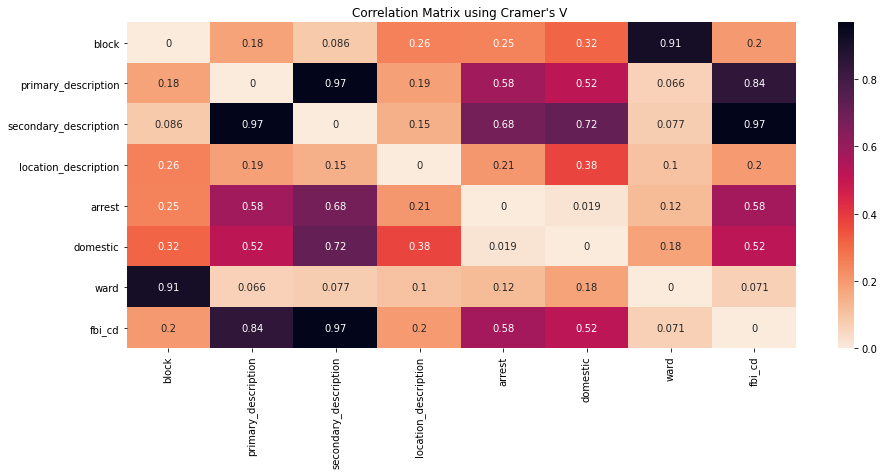

In [13]:
def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x,y)
    chi2 = ss.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2-((k-1)*(r-1))/(n-1))
    rcorr = r-((r-1)**2)/(n-1)
    kcorr = k-((k-1)**2)/(n-1)
    return np.sqrt(phi2corr/min((kcorr-1),(rcorr-1)))

# COlumns to generate correlation matrix
cols = df.columns[:8].tolist()
# Making zeros matrix with the length of items
corrM = np.zeros((len(cols),len(cols)))
# iterations through all possible two combinations of the list
for col1, col2 in itertools.combinations(cols, 2):
    # Setting the index name
    idx1, idx2 = cols.index(col1), cols.index(col2)
    # Calculating the corr using the defined function
    corrM[idx1, idx2] = cramers_v(df[col1], df[col2])
    # To have all values witth same number of decimals
    corrM[idx2, idx1] = corrM[idx1, idx2]
    
# Now we have our matrix
corr = (pd.DataFrame(corrM, index=cols, columns=cols)).T
plt.figure(figsize = (15,6))
cmap = sns.cm.rocket_r
sns.heatmap(corr, annot = True, cmap = cmap);
plt.title("Correlation Matrix using Cramer's V ");

> From the above table, we can clearly see that there are some features strongly corelated such as Ward and Block, which is interpreted esasily from the definition of wards since each one would be covering specific blocks! As well, fbi_cd and primary/secondary descriptions are strongly correlated since they both refer to the same crimes yet with a bit different generalized categories. An importatn observation is that the status of arrest/domestic is somehow related to the description of the crime.
* Based on the above correlations, I decided to drop `block` column since `ward` is representative for it, yet I would further investigate the difference between `fbi_cd` codes and `primary_description`!

In [14]:
df.drop('block', axis=1, inplace = True) # dropping block column
df.head()

,primary_description,secondary_description,location_description,arrest,domestic,ward,fbi_cd,latitude,longitude,month_of_occurrence,day_of_occurrence,time_of_occurrence
date_of_occurrence,,,,,,,,,,,,
2021-09-11 23:46:00,OTHER OFFENSE,HARASSMENT BY TELEPHONE,APARTMENT,N,N,6.0,Misc Non-Index Offense,41.748567,-87.607588,Sep,Weekend,Evening
2021-09-11 23:45:00,THEFT,FROM BUILDING,RESTAURANT,N,N,44.0,Larceny,41.939921,-87.653212,Sep,Weekend,Evening
2021-09-11 23:32:00,CRIMINAL DAMAGE,TO PROPERTY,APARTMENT,N,N,6.0,Vandalism,41.758545,-87.607538,Sep,Weekend,Evening
2021-09-11 23:30:00,ASSAULT,AGGRAVATED - KNIFE / CUTTING INSTRUMENT,ALLEY,N,N,19.0,Aggravated Assault,41.692581,-87.699647,Sep,Weekend,Evening
2021-09-11 23:30:00,ROBBERY,VEHICULAR HIJACKING,GAS STATION,N,N,22.0,Robbery,41.844160,-87.731342,Sep,Weekend,Evening


Now we have our final clean wrangled table that we shall use in further steps next as below.............................................................................................................................................

## 2. Data visualization

Next, we plot different primary descriptions of crimes in a countplot by `seaborn` to see how they are distributed. 

We then combine the least frequent categories of ('RITUALISM', 'OTHER NARCOTIC VIOLATION', 'NON-CRIMINAL', 'HUMAN TRAFFICKING', 'PUBLIC INDECENCY','GAMBLING', 'OBSCENITY') into a general category of others, while keeping it as the least frequent category in the dataset!! To visulaize this, we need to make the plot ordered descendingly to be readible for interpretation.

The same was performed for fbi_cd feature, and the least occurring valeus are replaced with OTHERS as well, which were ('Involuntary Manslaughter', 'Gambling', 'Embezzlement', 'Stolen Property', 'Prostitution', 'Liquor License')

In [15]:
# pattern 1 for primary_description
other_crimes = '|'.join(['RITUALISM', 'OTHER NARCOTIC VIOLATION', 'NON-CRIMINAL', 'HUMAN TRAFFICKING', 'PUBLIC INDECENCY',
                         'GAMBLING', 'OBSCENITY']) # Making a pattern for the crimes to combine
df['primary_description'] = df['primary_description'].str.replace(other_crimes, 'OTHERS', regex = True) # Then we combine them into others

# pattern 2 for fbi_Cd
other_fbi_cd_crimes = '|'.join(['Involuntary Manslaughter', 'Gambling', 'Embezzlement', 'Stolen Property', 'Prostitution',
                         'Liquor License']) # Making a pattern for the crimes to combine
df['fbi_cd'] = df['fbi_cd'].str.replace(other_fbi_cd_crimes, 'OTHERS', regex = True) # Then we combine them into others

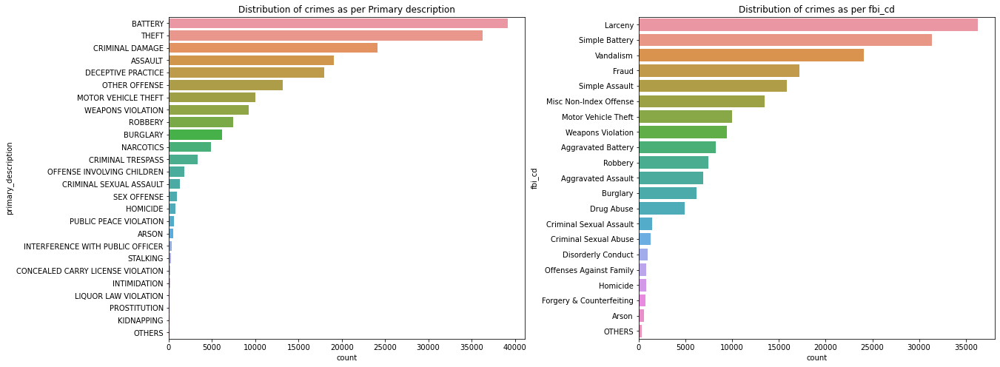

In [16]:
fig = plt.figure(figsize = (20,8)) # figure size

fig.add_subplot(121) # Subplot 1 primary description
sns.countplot(y = df['primary_description'], order = df['primary_description'].value_counts().index); # Plotting using seaborn
plt.title ('Distribution of crimes as per Primary description');

fig.add_subplot(122) # Subplot 2 fbi_cd
sns.countplot(y = df['fbi_cd'], order = df['fbi_cd'].value_counts().iloc[:30].index); # Plotting using seaborn
plt.title ('Distribution of crimes as per fbi_cd');

fig.subplots_adjust(wspace=0.32) # Making horizontal distance between the two plots

> We can get some significant insights here such that:
* Larceny (which is mainly about Theft) ranked first in fbi_cd categories because it divides battery into 2 groups of simple amd aggravated Battery. As well, there are some groups in fbi_cd such as 'offenses against family' which is not present in the primary description.
* In general, we can see that the most popoular crime types are: Battery - Theft(Larency), Crimincal damage (Vandalism), Deceptive practice (Fraud) and Assault!

Next, we investigate locations where crimes occurred, and we are intterested only in the most frequent locations or places that are at least 1% of the crimes happened at since there are already 129 locations and most them are minorities!

In [17]:
locations = (df['location_description'].value_counts(1)>0.005).sum() # Total locations that represent more than 1% of crime locations
print('There are %d locations of crime that are totally frequented at least one-half percent of the total dataset'%locations)

There are 22 locations of crime that are totally frequented at least one-half percent of the total dataset


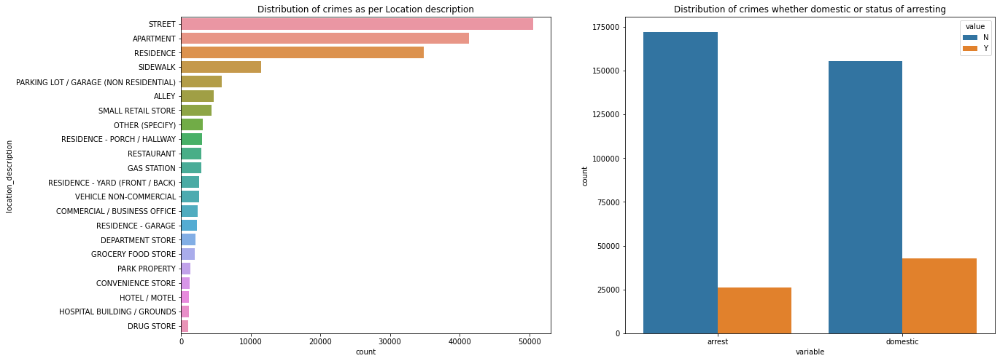

In [18]:
fig = plt.figure(figsize = (20,8)) # figure size

fig.add_subplot(121) # Subplot 1 location description
sns.countplot(y = df['location_description'], order = df['location_description'].value_counts().iloc[:22].index); # Plotting using seaborn
plt.title ('Distribution of crimes as per Location description');

fig.add_subplot(122) # Subplot 2 domestic and arresting status
sns.countplot(x="variable", hue="value", data=pd.melt(df[['arrest', 'domestic']]));
plt.title ('Distribution of crimes whether domestic or status of arresting');

> We can get some interesting data here such as:
* Street, Apartment and Residence cover more than 65% of all the places where crime occur, and then comes Sidelwalk and Garages!
* Along crimes distribution, we can see that 87% of the crimes did not make arresting, while onlt 21% of the crimes are domestic only!

Now we aim to interpret whether there is relationship betweeen the time of crime occurrence with the criem rate or with arresting rate as following:

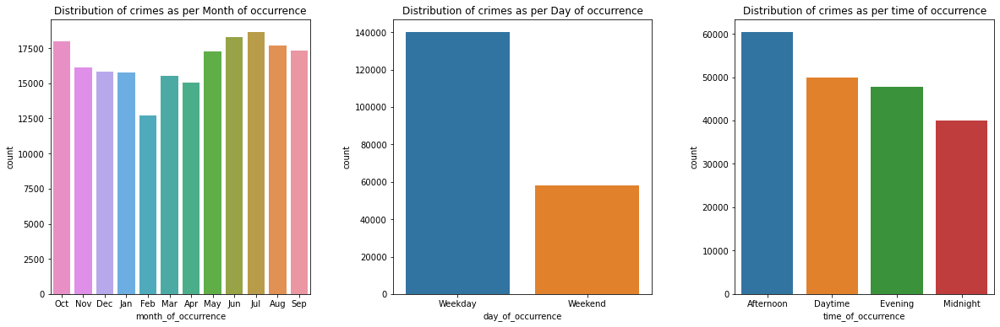

In [19]:
fig = plt.figure(figsize = (20,6)) # figure size

fig.add_subplot(131) # Subplot 1 primary description
sns.countplot(x = df['month_of_occurrence']); # Plotting using seaborn
plt.gca().invert_xaxis() # Inverting axis to be ascending since 2020 till 2021
plt.title ('Distribution of crimes as per Month of occurrence');

fig.add_subplot(132) # Subplot 2 fbi_cd
sns.countplot(x = df['day_of_occurrence'], order = df['day_of_occurrence'].value_counts().index); # Plotting using seaborn
plt.title ('Distribution of crimes as per Day of occurrence');

fig.add_subplot(133) # Subplot 2 fbi_cd
sns.countplot(x = df['time_of_occurrence'], order = df['time_of_occurrence'].value_counts().index); # Plotting using seaborn
plt.title ('Distribution of crimes as per time of occurrence');

fig.subplots_adjust(wspace=0.32) # Making horizontal distance between the two plots
plt.show()

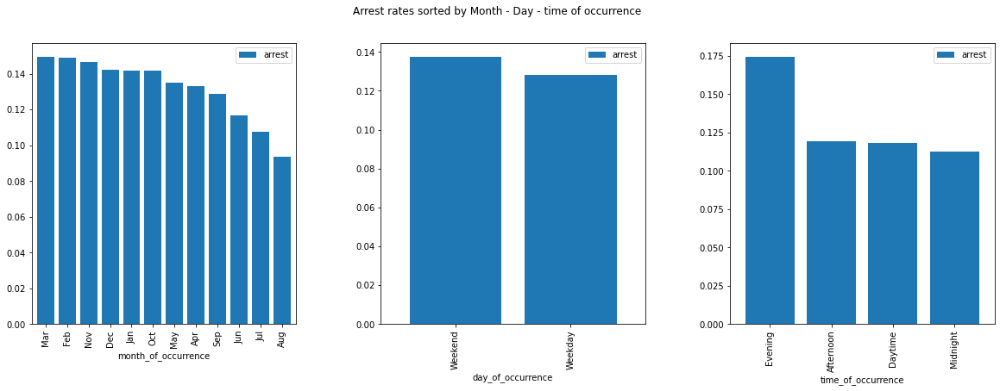

In [20]:
df_modified = df.copy() # Making a copy
df_modified.replace({'arrest'  : {'Y':1, 'N':0},
                     'domestic': {'Y':1, 'N':0}}, inplace = True) # Mapping

fig, axes = plt.subplots(nrows=1, ncols=3, figsize = (20,6))

df_modified_month = df_modified.groupby('month_of_occurrence')[['arrest']].mean() # group by and getting the average
df_modified_month.sort_values('arrest', ascending = False, inplace = True) # Sorting
df_modified_month.plot(kind = 'bar', width = 0.8, ax = axes[0]) # Plotting

df_modified_day = df_modified.groupby('day_of_occurrence')[['arrest']].mean() # group by and getting the average
df_modified_day.sort_values('arrest', ascending = False, inplace = True) # Sorting
df_modified_day.plot(kind = 'bar', width = 0.8, ax = axes[1]) # Plotting

df_modified_time = df_modified.groupby('time_of_occurrence')[['arrest']].mean() # group by and getting the average
df_modified_time.sort_values('arrest', ascending = False, inplace = True) # Sorting
df_modified_time.plot(kind = 'bar', width = 0.8, ax = axes[2]) # Plotting

plt.suptitle('Arrest rates sorted by Month - Day - time of occurrence')

fig.subplots_adjust(wspace=0.32) # Making horizontal distance between the two plots
plt.show()

> We can interpret the following from the above charts:
* Starting from Oct-20 till Sep-21, we can see that the crime rate decreases steadily till it is minimum in February, and then the crime rates start to increase again till it reaches the maximum value in July, and then the decreasing downoward starts again!
* On the other hand, we can see that the majority of crimes occur in weekdays, yet the percentage of crimes on weekends are significnatly higher than expected.
* It is also noticable that the majority of crimes occur in aftrnoon and Daytime, while crimes occur least after midnight!
* We can also arresting rate is at its higheest in the months where the crime commitment rate is already low, while it is at its lowest in Jul, Aug which are the months with the highest crime committement rates!
* We can also see that there is no significant difference between arresting rate for crimes committed in weekdays or weekends, while the crimes committed in the evening are significantly the highest to be captured or arrested!

Now, it is time to plot random samples of the locations where the crimes occurred on a map using `folium` library. We only plot a random sample of 1000 locations for the optimization of the map allocation speed. We used transperancy of the locations, so that we can determine the frequency of each location by visualization!

In [21]:
df_map = df.copy() # making a copy
df_map = df_map.drop_duplicates(subset='latitude', keep="first") # getting unique locations only
df_map = df_map.sample(n=10000) # getting a random sample of 1000 locations only

address = 'Chicago' # Address city

geolocator = Nominatim(user_agent="Chicago_explorer")
location = geolocator.geocode(address) # Getting the location of Chicago city
latitude = location.latitude # extracting latitude
longitude = location.longitude # extracting longitude

# create map of Chicago city places of the crime using latitude and longitude values
map_chicago = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng in zip(df_map['latitude'], df_map['longitude']):
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color='blue',
        fill=False,
        opacity=0.05,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_chicago)  
    
map_chicago

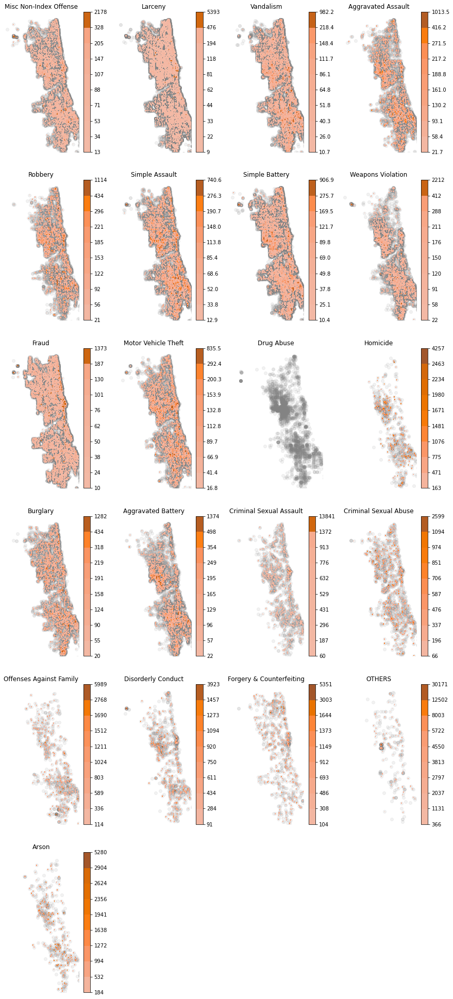

In [22]:
unique_crimes = df['fbi_cd'].unique() # distinict crime categories
fig = plt.figure(figsize=(15,35)) # Setting a plot figure size

for i, crime_type in enumerate(unique_crimes): # iterating through the crime categories
    crimes = df[df['fbi_cd']==crime_type] # the proposed row

    ax = fig.add_subplot(int(np.ceil(float(len(unique_crimes)) / 4)), 4, i+1)
    ax.set_title(crime_type) # setting title name
    ax.set_xlim(df['longitude'].min() - .02,df['longitude'].max() - 0.02) # min and max x axis of longitude
    ax.set_ylim(df['latitude'].min() + .02,df['latitude'].max() + .02) # min and max x axis of latitutde
    ax.set_axis_off() # removing axes since we need visualization only    
    try:
        sns.regplot('longitude', 'latitude',
                   data= crimes,
                   fit_reg=False,
                   scatter_kws={'alpha':.1, 'color':'grey'}, # scatter all data originally with grey color
                   ax=ax)
    
    
        sns.kdeplot(data= crimes, # Plotting a heatmap
                    x='longitude', y='latitude',
                    bw=.005,
                    cbar=True, 
                    shade=True, 
                    shade_lowest=False,
                    palette="YlGnBu", # palette color
                    ax = ax)
        
        ax.set_title(crime_type) # setting title name
        ax.set_xlim(df['longitude'].min() - .02,df['longitude'].max() - 0.02) # min and max x axis of longitude
        ax.set_ylim(df['latitude'].min() + .02,df['latitude'].max() + .02) # min and max x axis of latitutde
        ax.set_axis_off() # removing axes since we need visualization only
    
    except:
        continue  
plt.show()

Next step would be plotting crime rates on a daily basis to figure out wheteher there is a pattern or not using `resample` method which is fundamentally a data aggregation and here it aggregates the number of crimes that happened everyday so that we can plot them on daily basis! On the other hand, I used`.rolling` method for every 30 days, so that we can see the cumulative crime rates of one prior month everyday in the selected period! Furthermore, I would plot the rolled data individually per crime type to see the trends!

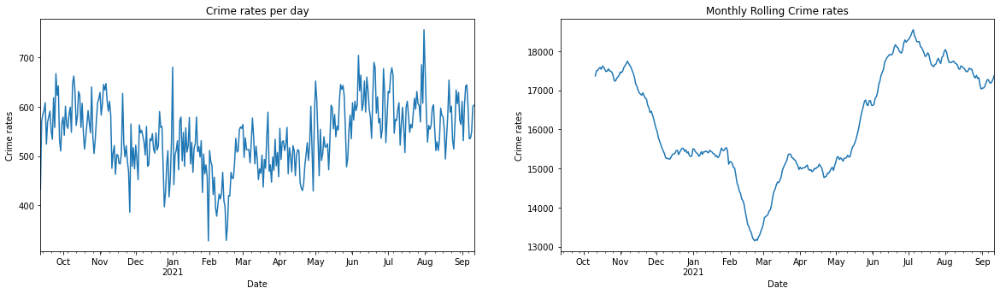

In [23]:
fig = plt.figure(figsize = (20,5)) # figure size

fig.add_subplot(121) # Subplot 1 Daily Crime rates
df.resample('d').size().plot() # Resample do aggregation for the data everyday
plt.xlabel('Date')
plt.ylabel('Crime rates')
plt.title('Crime rates per day')

fig.add_subplot(122) # Subplot 2 Monthly rolling crime rates
df.resample('D').size().rolling(30).sum().plot() # Rolling every 30 day cumulatively
plt.xlabel('Date')
plt.ylabel('Crime rates')
plt.title('Monthly Rolling Crime rates');

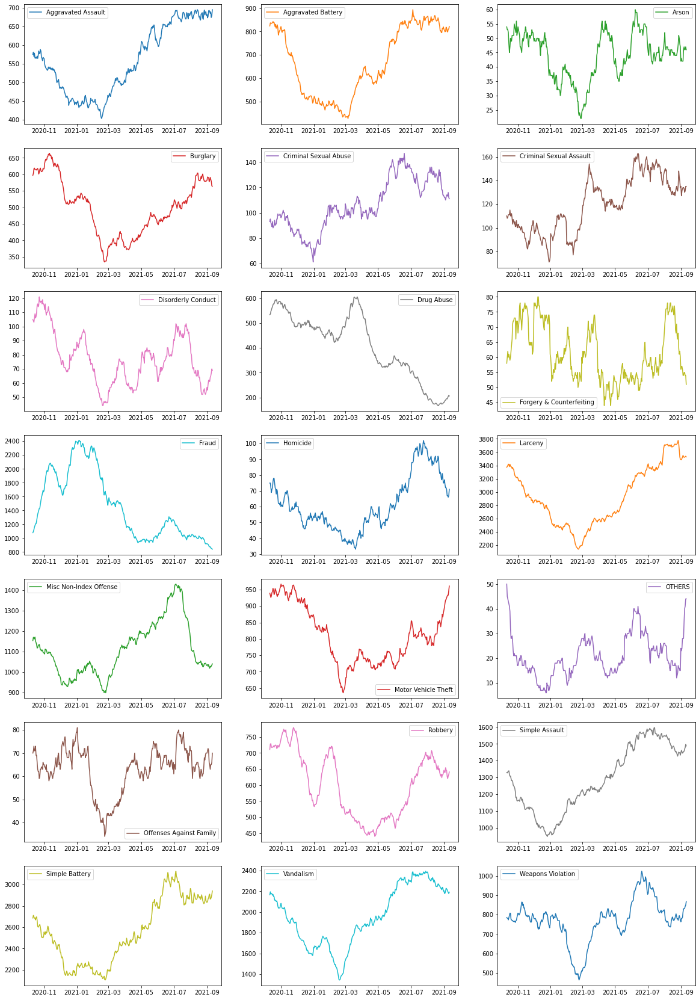

In [24]:
pivot_crimes = df.pivot_table('primary_description', aggfunc = np.size, columns = 'fbi_cd', index = df.index.date, fill_value = 0) # Pivot table
pivot_crimes.rolling(30).sum().plot(figsize=(20, 30), subplots=True, layout=(-1, 3), sharex=False, sharey=False); # General plot with subplots

> we can notice that both graphs follow the same trend which was already expected from the previouslt plotted Distribution of crimes as per Month of occurrence yet this could be insightful for us to do further investigation for each type of the crimes!
* We can also notice that all crimes follow the same rate of decreasing till minimum in Feb then spikely increase to a peak in July as excpected except for 2 crime types which are (Fraud and Drug abuse) which are following a steep decreasing trend that could be found significantly!

Next step would be plotting different types of crimes against the rate of arrests being made across them and against domesticity of the crimes! We would use the crime categories of `fbi_cd` because the are more generic!

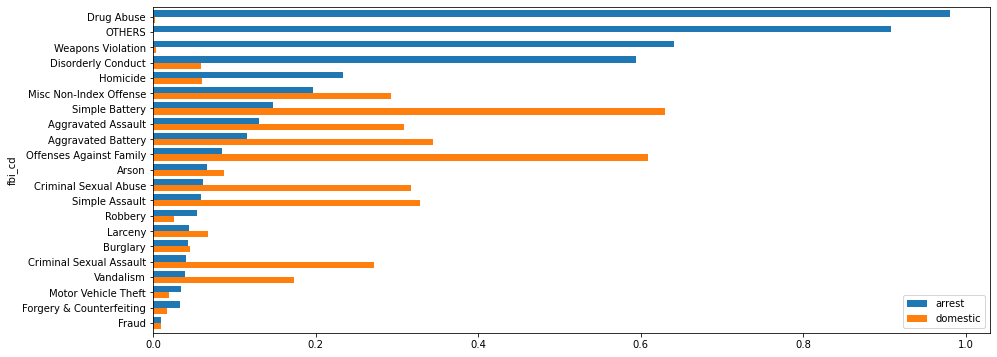

In [25]:
df_modified = df.copy() # Making a copy
df_modified.replace({'arrest'  : {'Y':1, 'N':0},
                     'domestic': {'Y':1, 'N':0}}, inplace = True) # Mapping
df_modified = df_modified.groupby('fbi_cd')[['arrest', 'domestic']].mean() # group by and getting the average
df_modified.sort_values('arrest', ascending = False, inplace = True) # Sorting
df_modified.plot(kind = 'barh', width = 0.8, figsize = (15,6)) # Plotting
plt.gca().invert_yaxis() # Inverting axis to be descending

> We can readily notice that the highest conversion rate of arrests were made with drug abuse, weapons violation and other crimes that are not classifed as domestic. Then comes disorderly conduct crimes and homicides! On the other hand, we can see that Fraud and vanalism are the least crimes to be arrested although they are ranked in the top five committed crimes overall!

Now and after we performed some visualization, we can drop some additional columns which we no longer need to visualize or use later. This would include (`primary_dersctiption`, `latitude`, `longitude`.

In [26]:
df.drop(['primary_description', 'secondary_description', 'latitude', 'longitude'], axis =1, inplace = True) # Dropping unnecessary columns
df['ward'] = df['ward'].astype(int).astype(str) # making sure ward is string objects
df['ward'] = 'ward_' + df['ward'].astype(str) # Adding prefix to identify it as object easily
df.replace({'arrest':  {'N':0, 'Y':1},
            'domestic':{'N':0, 'Y':1}}, inplace = True) # Mapping yes to 1 and No to 0

In [27]:
df.head()

,location_description,arrest,domestic,ward,fbi_cd,month_of_occurrence,day_of_occurrence,time_of_occurrence
date_of_occurrence,,,,,,,,
2021-09-11 23:46:00,APARTMENT,0,0,ward_6,Misc Non-Index Offense,Sep,Weekend,Evening
2021-09-11 23:45:00,RESTAURANT,0,0,ward_44,Larceny,Sep,Weekend,Evening
2021-09-11 23:32:00,APARTMENT,0,0,ward_6,Vandalism,Sep,Weekend,Evening
2021-09-11 23:30:00,ALLEY,0,0,ward_19,Aggravated Assault,Sep,Weekend,Evening
2021-09-11 23:30:00,GAS STATION,0,0,ward_22,Robbery,Sep,Weekend,Evening


## 3. Statistical Analysis

<h3>CHI-Square: Analysis of Variance</h3>
<p>For categorical data, Chi-Square is a statistical method used to.A chi-square test is a statistical test used to compare observed results with expected results. The purpose of this test is to determine if a difference between observed data and expected data is due to chance, or if it is due to a relationship between the variables you are studying. </p>

<p><b>P-value</b>:  P-value tells how statistically significant our calculated score value is.</p>

<p><b>For post-hoc analysis</b> following a Chi-Square, we use what is referred to as the Bonferroni Adjustment. This adjustment is used to counteract the problem of Type I Error that occurs when multiple comparisons are made. Following a Chi-Square test that includes an explanatory variable with 3 or more groups, we need to subset to each possible paired comparison. When interpreting these paired comparisons, rather than setting the  α -level (p-value) at 0.05, we divide 0.05 by the number of paired comparisons that we will be making. The result is our new  α -level (p-value)</p>

In [28]:
def ad_hoc_chi_square(target_column, study_variable, df, alpha = 0.05):
    
    '''
        INPUT
        variable: the column that you are performing 
        target_column: which you are measuring significancy agaisnt
        study_varibale: colums you perform analysis on
                                                        '''

    col = study_variable
    myCrosstable = pd.crosstab(df[col], df[target_column])
    # Setting correction option to false
    chiVal, pVal, df, exp = chi2_contingency(myCrosstable, correction = True)

    # Setting Bonferoni correction for alpha for multipair tests
    num_pairs = myCrosstable.shape[0]*myCrosstable.shape[1]
    alpha_corrected = alpha / (num_pairs)

    # In case there is a significant difference
    if pVal < alpha:
        print('Feature is: ' + col + ' measured against: ' + target_column)
        print('\nNull Hypothesis is rejected and there is a significant difference with confidence interval of 95%')
        print('p_value is {}'.format(pVal))
        print('Test method: Chi-Square Multiple comparisons ')
        print('method = Bonferroni, alphacBonf = {}'.format(round(alpha_corrected, 4)))

        # Making some calculations to be used in calculating adjusted residuals or z scores
        colTotals = myCrosstable.sum()
        nCols = len(colTotals)
        rowTotals = myCrosstable.sum(axis=1)
        nRows = len(rowTotals)
        n = sum(rowTotals)

        # Setting data into a dataframe to be readible
        df_crosstab = pd.DataFrame(columns=[col, target_column, 'AdjRes'])
        for i in range(nRows):
            for j in range(nCols):
                AdjRes = (myCrosstable.iloc[i,j] - exp[i,j]) / (exp[i,j]*(1-rowTotals.iloc[i]/n)*(1-colTotals.iloc[j]/n))**0.5
                df_crosstab = df_crosstab.append({col:myCrosstable.index[i], target_column:myCrosstable.columns[j], 'AdjRes':AdjRes}, ignore_index=True)

        # Calculating one side p value from z scores
        df_crosstab['p_val'] = norm.sf(abs(df_crosstab['AdjRes']))
        # Setting a column for the significance whether higher or less than expected values
        df_crosstab['state'] = np.where(df_crosstab['AdjRes'] > 0, 'more likely than expected', 'less likely than expected')
        # Dropping AdjRes columns after extracting necessary infroamtion from it
        df_crosstab.drop('AdjRes', axis = 1, inplace = True)
        # Keeping the dataframe of only significant data
        df_crosstab = df_crosstab[df_crosstab['p_val'] < alpha_corrected].reset_index(drop = True)

    else:
        print(col)
        print('Null Hypothesis can not be rejected and there is no significant difference')
    print('\n\n====================================================\n\n')
    return(df_crosstab)

Next, we are interested to find out the significancy of the follwoing:
1. Location descriptions where it is significantly more likely for the crimes to be arrested than usual across 129 locations!
2. Crime types that are more likely to be arrested than the average among 21 type!
3. Since street is the highest location accompanied with crimes, we measure the significancy of crimes committed in the streets.
4. Lastly and since Larency/Theft crimes according to `fbi_cd` codes are the most common, I will measure the significancy of locations where those crimes are committed.

In [29]:
arrest_location_significancy = ad_hoc_chi_square('arrest', 'location_description', df) # applying ad hoc analysis
arrest_location_significancy = arrest_location_significancy.loc[arrest_location_significancy['arrest'] == 1] # where arrest is true

more_likely = arrest_location_significancy.loc[arrest_location_significancy['state'] == 'more likely than expected'] # positive significant
merged_more_likely = more_likely['location_description'].str.cat(sep=', ') # merging them

less_likely = arrest_location_significancy.loc[arrest_location_significancy['state'] == 'less likely than expected'] # negative significant
merged_less_likely = less_likely['location_description'].str.cat(sep=', ') # merging them

print('The following locations are more likely to have a crime arrested at than expected:\n' + merged_more_likely) #printing
print('\nThe following locations are less likely to have a crime arrested at than expected:\n' + merged_less_likely)


Feature is: location_description measured against: arrest

Null Hypothesis is rejected and there is a significant difference with confidence interval of 95%
p_value is 0.0
Test method: Chi-Square Multiple comparisons 
method = Bonferroni, alphacBonf = 0.0002




The following locations are more likely to have a crime arrested at than expected:
AIRPORT BUILDING NON-TERMINAL - SECURE AREA, AIRPORT TERMINAL LOWER LEVEL - NON-SECURE AREA, AIRPORT TERMINAL UPPER LEVEL - NON-SECURE AREA, AIRPORT TERMINAL UPPER LEVEL - SECURE AREA, AIRPORT/AIRCRAFT, ALLEY, CHA PARKING LOT / GROUNDS, CONVENIENCE STORE, CTA PLATFORM, CTA STATION, CTA TRACKS - RIGHT OF WAY, DEPARTMENT STORE, GAS STATION, GROCERY FOOD STORE, HOSPITAL BUILDING / GROUNDS, HOTEL / MOTEL, HOUSE, JAIL / LOCK-UP FACILITY, POLICE FACILITY / VEHICLE PARKING LOT, SIDEWALK, SPORTS ARENA / STADIUM, STREET, VACANT LOT / LAND, VEHICLE NON-COMMERCIAL

The following locations are less likely to have a crime arrested at than expected:
APARTMENT,

In [30]:
arrest_location_significancy = ad_hoc_chi_square('arrest', 'fbi_cd', df) # applying ad hoc analysis
arrest_location_significancy = arrest_location_significancy.loc[arrest_location_significancy['arrest'] == 1] # where arrest is true

more_likely = arrest_location_significancy.loc[arrest_location_significancy['state'] == 'more likely than expected'] # positive significant
merged_more_likely = more_likely['fbi_cd'].str.cat(sep=', ') # merging them

less_likely = arrest_location_significancy.loc[arrest_location_significancy['state'] == 'less likely than expected'] # negative significant
merged_less_likely = less_likely['fbi_cd'].str.cat(sep=', ') # merging them

print('The following crime types are more likely to have a crime arrested at than expected:\n' + merged_more_likely) #printing
print('\nThe following crime types are less likely to have a crime arrested at than expected:\n' + merged_less_likely)


Feature is: fbi_cd measured against: arrest

Null Hypothesis is rejected and there is a significant difference with confidence interval of 95%
p_value is 0.0
Test method: Chi-Square Multiple comparisons 
method = Bonferroni, alphacBonf = 0.0012




The following crime types are more likely to have a crime arrested at than expected:
Disorderly Conduct, Drug Abuse, Homicide, Misc Non-Index Offense, OTHERS, Simple Battery, Weapons Violation

The following crime types are less likely to have a crime arrested at than expected:
Aggravated Battery, Arson, Burglary, Criminal Sexual Abuse, Criminal Sexual Assault, Forgery & Counterfeiting, Fraud, Larceny, Motor Vehicle Theft, Offenses Against Family, Robbery, Simple Assault, Vandalism


In [31]:
arrest_location_significancy = ad_hoc_chi_square('location_description', 'fbi_cd', df) # applying ad hoc analysis
arrest_location_significancy = arrest_location_significancy.loc[arrest_location_significancy['location_description'] == 'STREET'] # where arrest is true

more_likely = arrest_location_significancy.loc[arrest_location_significancy['state'] == 'more likely than expected'] # positive significant
merged_more_likely = more_likely['fbi_cd'].str.cat(sep=', ') # merging them

less_likely = arrest_location_significancy.loc[arrest_location_significancy['state'] == 'less likely than expected'] # negative significant
merged_less_likely = less_likely['fbi_cd'].str.cat(sep=', ') # merging them

print('The following crime types are more likely to have occurred at street than expected:\n' + merged_more_likely) #printing
print('\nThe following crime types are less likely to have occurred at street than expected:\n' + merged_less_likely)


Feature is: fbi_cd measured against: location_description

Null Hypothesis is rejected and there is a significant difference with confidence interval of 95%
p_value is 0.0
Test method: Chi-Square Multiple comparisons 
method = Bonferroni, alphacBonf = 0.0




The following crime types are more likely to have occurred at street than expected:
Aggravated Assault, Disorderly Conduct, Drug Abuse, Homicide, Motor Vehicle Theft, Robbery, Vandalism, Weapons Violation

The following crime types are less likely to have occurred at street than expected:
Arson, Burglary, Criminal Sexual Abuse, Criminal Sexual Assault, Forgery & Counterfeiting, Fraud, Misc Non-Index Offense, Offenses Against Family, Simple Assault, Simple Battery


In [32]:
arrest_location_significancy = ad_hoc_chi_square('fbi_cd', 'location_description', df) # applying ad hoc analysis
arrest_location_significancy = arrest_location_significancy.loc[arrest_location_significancy['fbi_cd'] == 'Larceny'] # where arrest is true

more_likely = arrest_location_significancy.loc[arrest_location_significancy['state'] == 'more likely than expected'] # positive significant
merged_more_likely = more_likely['location_description'].str.cat(sep=', ') # merging them

less_likely = arrest_location_significancy.loc[arrest_location_significancy['state'] == 'less likely than expected'] # negative significant
merged_less_likely = less_likely['location_description'].str.cat(sep=', ') # merging them

print('The following locations are more likely to have Larceny/Theft type crime than expected:\n' + merged_more_likely) #printing
print('\nThe following locations are less likely to have Larceny/Theft type crime than expected:\n' + merged_less_likely)


Feature is: location_description measured against: fbi_cd

Null Hypothesis is rejected and there is a significant difference with confidence interval of 95%
p_value is 0.0
Test method: Chi-Square Multiple comparisons 
method = Bonferroni, alphacBonf = 0.0




The following locations are more likely to have Larceny/Theft type crime than expected:
AIRPORT TERMINAL LOWER LEVEL - NON-SECURE AREA, AIRPORT TERMINAL LOWER LEVEL - SECURE AREA, AIRPORT TRANSPORTATION SYSTEM (ATS), ATHLETIC CLUB, BAR OR TAVERN, CONSTRUCTION SITE, CONVENIENCE STORE, CTA TRAIN, DEPARTMENT STORE, DRIVEWAY - RESIDENTIAL, DRUG STORE, GROCERY FOOD STORE, OTHER (SPECIFY), PARK PROPERTY, PARKING LOT / GARAGE (NON RESIDENTIAL), RESIDENCE - PORCH / HALLWAY, RESIDENCE - YARD (FRONT / BACK), SMALL RETAIL STORE, TAVERN / LIQUOR STORE, VEHICLE - COMMERCIAL, VEHICLE - DELIVERY TRUCK, VEHICLE NON-COMMERCIAL

The following locations are less likely to have Larceny/Theft type crime than expected:
ALLEY, APARTMENT, AUTO, BANK, CHA

> From the above statistical analysis, we can refer the following:
* For the top 4 locations of crimes committed: Street and Sidewalks are significantly high while Apartments and Residence are significantly lower than expected to be a place of crime!
* For the highest freqeunt crime types, crime types, Lareency, Aggravated Battery and Vandalism are less likely to be arrested, while Simple Battery crimes are high likely to be so!
* The top four types of crimes are not significantly related to the location of street where most crimes happened there!
* Larency of thefts are more singinifcantly likely to occur in big places such as Airport terminals, athletic clubs and garages!

------------------
**Thank you for going through the notebook!**
> Please let me know if you got any comments.